# Tutorial 3: Analysis and Visualization Methods

> **Reading Time**: ~40-50 minutes
> **Difficulty**: Beginner
> **Prerequisites**: [Tutorial 1](./01_build_cann_model.ipynb) and [Tutorial 2](./02_task_and_simulation.ipynb)

This tutorial introduces visualization and analysis methods in the CANNs analyzer module.

---

## Table of Contents

1. [Analyzer Module and PlotConfigs Overview](#1-analyzer-module-and-plotconfigs-overview)
2. [1D Analysis Methods](#2-1d-analysis-methods)
3. [Energy Landscapes for Different Tasks](#3-energy-landscapes-for-different-tasks)
4. [2D Analysis Methods](#4-2d-analysis-methods)
5. [Next Steps](#5-next-steps)

---

## 1. Analyzer Module and PlotConfigs Overview

The `canns.analyzer.plotting` module provides visualization methods for analyzing simulation results. All plotting functions use the **PlotConfigs** system for unified configuration management.

### 1.1 Available Plotting Methods

**1D Model Analysis**:
- `energy_landscape_1d_static` - Static energy landscape
- `energy_landscape_1d_animation` - Animated energy landscape
- `raster_plot` - Spike raster plot
- `average_firing_rate_plot` - Average firing rate over time
- `tuning_curve` - Neural tuning curve

**2D Model Analysis**:
- `energy_landscape_2d_static` - 2D static energy landscape
- `energy_landscape_2d_animation` - 2D animated energy landscape

### 1.2 PlotConfigs System

**PlotConfigs** provides method-specific configuration builders. Each plotting method has a corresponding config builder:

```python
from canns.analyzer.plotting import (
    PlotConfigs,
    energy_landscape_1d_static,
    energy_landscape_1d_animation,
    raster_plot,
    average_firing_rate_plot,
    tuning_curve,
)

# Create configuration for each method
config_static = PlotConfigs.energy_landscape_1d_static(
    figsize=(10, 6),
    title='Energy Landscape',
    show=True,        # Display plot (default)
    save_path=None    # Don't save to file (default)
)

# Use configuration with plotting function
energy_landscape_1d_static(
    data_sets={'r': (model.x, r_history)},
    config=config_static
)
```

> **Note**: This is a conceptual example. The actual usage will be demonstrated in Section 2 below with real data.


**Key Benefits**:
- **Unified Interface**: All plotting methods follow the same pattern
- **Configuration Reuse**: Create once, use multiple times
- **Clear Defaults**: `show=True, save_path=None` for interactive visualization

> **Note**: By default, plots are displayed (`show=True`) and not saved (`save_path=None`). Set `save_path='filename.png'` to save plots.

---

## 2. 1D Analysis Methods

Let's demonstrate all 1D analysis methods using a SmoothTracking1D task.

### 2.1 Preparation

In [ ]:
import brainpy.math as bm
from canns.models.basic import CANN1D
from canns.task.tracking import SmoothTracking1D
from canns.analyzer.plotting import (
    PlotConfigs,
    energy_landscape_1d_static,
    energy_landscape_1d_animation,
    raster_plot,
    average_firing_rate_plot,
    tuning_curve,
)

# Setup environment
bm.set_dt(0.1)

# Create model
model = CANN1D(num=256, tau=1.0, k=8.1, a=0.5, A=10, J0=4.0)

# Create smooth tracking task
# Stimulus moves from -2.0 to 2.0, then to -1.0
task = SmoothTracking1D(
    cann_instance=model,
    Iext=[-4.0, 4.0, -2.0, 2.0],      # Keypoint positions
    duration=[20.0, 30.0, 20.0], # Duration for each segment
    time_step=bm.get_dt(),
)

# Get task data
task.get_data()

# Define simulation step
def run_step(t, inp):
    model.update(inp)
    return model.u.value, model.r.value, model.inp.value

# Run simulation
u_history, r_history, input_history = bm.for_loop(run_step, operands=(task.run_steps, task.data), progress_bar=10)

### 2.2 Energy Landscape (Static)

`energy_landscape_1d_static` plots firing rate over time and neuron position:

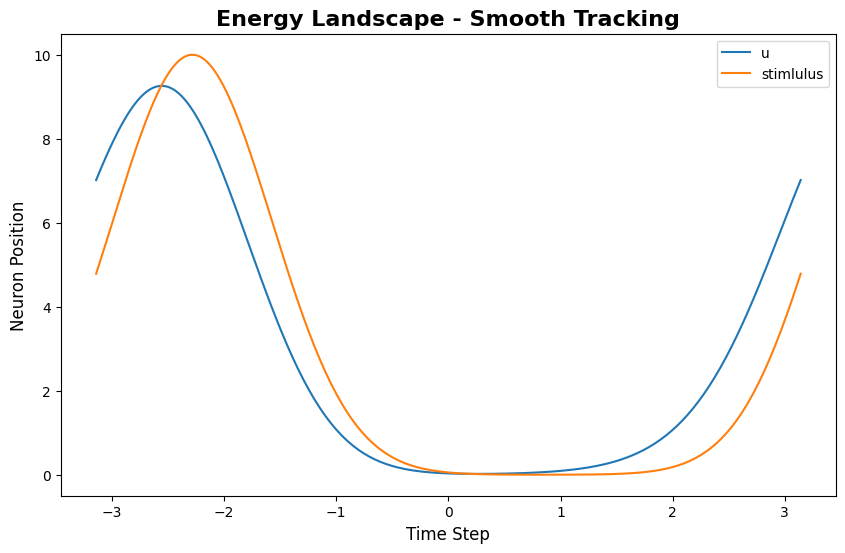

(<Figure size 1000x600 with 1 Axes>,
 <Axes: title={'center': 'Energy Landscape - Smooth Tracking'}, xlabel='Time Step', ylabel='Neuron Position'>)

In [26]:
index = 200 # Time step to visualize

# Configure static energy landscape
config_static = PlotConfigs.energy_landscape_1d_static(
    figsize=(10, 6),
    title='Energy Landscape - Smooth Tracking',
    xlabel='Time Step',
    ylabel='Neuron Position',
    show=True,
    save_path=None
)

# Plot static energy landscape
energy_landscape_1d_static(
    data_sets={'u': (model.x, u_history[index]), 'stimlulus': (model.x, input_history[index])},
    config=config_static
)

This shows the bump trajectory over time: x-axis is time, y-axis is feature space position, color intensity represents firing rate.

### 2.3 Energy Landscape (Animation)

`energy_landscape_1d_animation` generates a dynamic animation showing bump evolution:

In [27]:
# Configure animation
config_anim = PlotConfigs.energy_landscape_1d_animation(
    time_steps_per_second=100,  # 100 time steps = 1 second of real time
    fps=20,                      # 20 frames per second
    title='Energy Landscape Animation',
    xlabel='Neuron Position',
    ylabel='Firing Rate',
    repeat=True,
    show=True,
    save_path=None  # Set to 'animation.gif' to save
)

# Generate animation
energy_landscape_1d_animation(
    data_sets={'u': (model.x, u_history), 'stimlulus': (model.x, input_history)},
    config=config_anim
)

The animation shows population firing rate distribution at each time step, visualizing how the bump moves through feature space.

**Animation Parameters**:
- `time_steps_per_second`: How many simulation time steps per real-world second
- `fps`: Frames per second for the animation
- `repeat`: Whether to loop the animation

### 2.4 Raster Plot

`raster_plot` shows spike timing of neurons:

In [ ]:
from canns.analyzer.utils import firing_rate_to_spike_train

# Configure raster plot
config_raster = PlotConfigs.raster_plot(
    figsize=(10, 6),
    title='Raster Plot',
    xlabel='Time Step',
    ylabel='Neuron Index',
    show=True,
    save_path=None
)

# use u to generate spike train, because it has higher values
spike_train = firing_rate_to_spike_train(u_history, dt_spike=0.01, dt_rate=bm.get_dt())

# Plot raster
raster_plot(
    spike_train=spike_train,
    config=config_raster
)

Each dot represents a neuron firing at a specific time. The pattern reveals the bump's spatial structure and temporal evolution.

### 2.5 Average Firing Rate Plot

`average_firing_rate_plot` shows population-averaged firing rate over time:

In [ ]:
# Configure average firing rate plot
config_avg = PlotConfigs.average_firing_rate_plot(
    figsize=(10, 4),
    title='Average Firing Rate',
    xlabel='Time (ms)',
    ylabel='Average Firing Rate',
    show=True,
    save_path=None
)

# Plot average firing rate
average_firing_rate_plot(
    spike_train=spike_train,
    dt=bm.get_dt(),
    config=config_avg
)

This plot shows the overall activity level of the network over time.

### 2.6 Tuning Curve

`tuning_curve` shows individual neurons' responses to different stimulus positions:

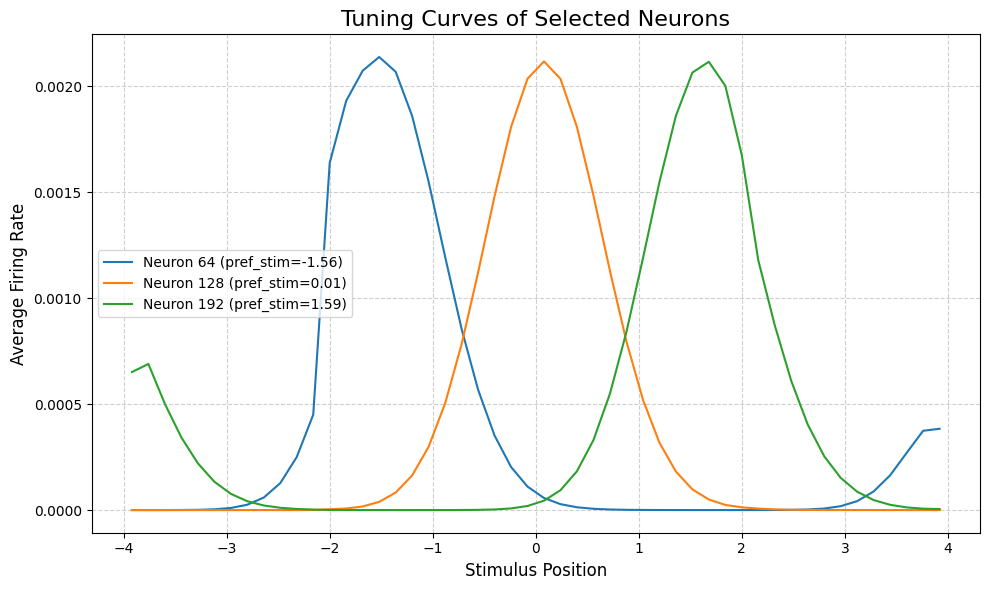

(<Figure size 1000x600 with 1 Axes>,
 <Axes: title={'center': 'Tuning Curves of Selected Neurons'}, xlabel='Stimulus Position', ylabel='Average Firing Rate'>)

In [30]:
# Configure tuning curve
config_tuning = PlotConfigs.tuning_curve(
    num_bins=50,          # Number of position bins
    pref_stim=model.x,    # Preferred stimuli for each neuron
    title='Tuning Curves of Selected Neurons',
    xlabel='Stimulus Position',
    ylabel='Average Firing Rate',
    show=True,
    save_path=None,
)

# Select neurons to plot
neuron_indices = [64, 128, 192]  # Left, center, right

# Plot tuning curves
tuning_curve(
    stimulus=task.Iext_sequence.squeeze(),
    firing_rates=r_history,
    neuron_indices=neuron_indices,
    config=config_tuning
)

The tuning curve reveals each neuron's "preferred position" - the stimulus location that elicits maximum response. For CANN models, neurons typically have bell-shaped tuning curves centered at different positions.

---

## 3. Energy Landscapes for Different Tasks

Different tasks produce characteristic energy landscape patterns. Let's compare three tracking tasks:

### 3.1 PopulationCoding1D

Population coding demonstrates memory maintenance after brief stimulus presentation.

In [ ]:
from canns.task.tracking import PopulationCoding1D

# Re-initialize model
model = CANN1D(num=256, tau=1.0, k=8.1, a=0.5, A=10, J0=4.0)
model.init_state()

# Population coding task
task_pc = PopulationCoding1D(
    cann_instance=model,
    before_duration=10.0,
    after_duration=10.0,
    Iext=0.0,
    duration=20.0,
    time_step=bm.get_dt(),
)

# Get data and run simulation
task_pc.get_data()

u_pc, r_pc, inp_pc = bm.for_loop(run_step, operands=(task_pc.run_steps, task_pc.data), progress_bar=10)

# Visualize
config_anim = PlotConfigs.energy_landscape_1d_animation(
    time_steps_per_second=100,  # 100 time steps = 1 second of real time
    fps=20,                      # 20 frames per second
    title='Energy Landscape Animation - Population Coding',
    xlabel='Neuron Position',
    ylabel='Firing Rate',
    repeat=True,
    show=True,
    save_path=None  # Set to 'animation.gif' to save
)

# Generate animation
energy_landscape_1d_animation(
    data_sets={'u': (model.x, u_pc), 'stimlulus': (model.x, inp_pc)},
    config=config_anim
)

**Characteristic Pattern**: The bump forms during stimulus presentation (middle section) and persists at the same location after stimulus ends (right section). This demonstrates the attractor's stability and memory maintenance capability.

### 3.2 TemplateMatching1D

Template matching demonstrates pattern completion from noisy input.

In [ ]:
from canns.task.tracking import TemplateMatching1D

# Re-initialize model
model.init_state()

# Template matching task
task_tm = TemplateMatching1D(
    cann_instance=model,
    Iext=1.0,
    duration=50.0,
    time_step=bm.get_dt(),
)

# Get data and run simulation
task_tm.get_data()

u_tm, r_tm, inp_tm = bm.for_loop(run_step, operands=(task_tm.run_steps, task_tm.data), progress_bar=10)

# Visualize
config_anim = PlotConfigs.energy_landscape_1d_animation(
    time_steps_per_second=100,  # 100 time steps = 1 second of real time
    fps=20,                      # 20 frames per second
    title='Energy Landscape Animation - Template Matching',
    xlabel='Neuron Position',
    ylabel='Firing Rate',
    repeat=True,
    show=True,
    save_path=None  # Set to 'animation.gif' to save
)

# Generate animation
energy_landscape_1d_animation(
    data_sets={'u': (model.x, u_tm), 'stimlulus': (model.x, inp_tm)},
    config=config_anim
)

**Characteristic Pattern**: Initially distributed activity (noisy input creates broad, weak activation) converges to a single sharp bump. This demonstrates the attractor's ability to "clean up" noisy inputs through convergence.

### 3.3 SmoothTracking1D

Smooth tracking demonstrates the bump following a moving stimulus.

In [ ]:
from canns.task.tracking import SmoothTracking1D

# Re-initialize model
model.init_state()

# Smooth tracking task
task_st = SmoothTracking1D(
    cann_instance=model,
    Iext=[-2.0, 2.0],
    duration=[50.0],
    time_step=bm.get_dt(),
)

# Get data and run simulation
task_st.get_data()

u_st, r_st, inp_st = bm.for_loop(run_step, operands=(task_st.run_steps, task_st.data), progress_bar=10)

# Visualize
config_anim = PlotConfigs.energy_landscape_1d_animation(
    time_steps_per_second=100,  # 100 time steps = 1 second of real time
    fps=20,                      # 20 frames per second
    title='Energy Landscape Animation - Smooth Tracking',
    xlabel='Neuron Position',
    ylabel='Firing Rate',
    repeat=True,
    show=True,
    save_path=None  # Set to 'animation.gif' to save
)

# Generate animation
energy_landscape_1d_animation(
    data_sets={'u': (model.x, u_st), 'stimlulus': (model.x, inp_st)},
    config=config_anim
)

**Characteristic Pattern**: The bump smoothly moves from left to right, tracking the moving stimulus. This demonstrates the attractor's ability to integrate external input while maintaining stable bump structure.

### 3.4 Comparison Summary

| Task | Input Pattern | Energy Landscape Feature | Demonstrates |
|------|--------------|--------------------------|--------------|
| PopulationCoding | Brief stimulus | Bump forms and persists in place | Memory maintenance |
| TemplateMatching | Noisy continuous input | Distributed activity → Sharp bump | Pattern completion |
| SmoothTracking | Moving stimulus | Bump smoothly follows trajectory | Stimulus tracking |

These three patterns illustrate the three key computational capabilities of continuous attractor networks: **memory**, **denoising**, and **tracking**.

---

## 4. 2D Analysis Methods

For CANN2D models, the analyzer provides corresponding 2D visualization methods. The PlotConfigs pattern works identically for 2D visualizations.

### 4.1 Preparing CANN2D Simulation

In [ ]:
from canns.models.basic import CANN2D
from canns.task.tracking import SmoothTracking2D
from canns.analyzer.plotting import (
    PlotConfigs,
    energy_landscape_2d_static,
    energy_landscape_2d_animation,
    plot_firing_field_heatmap,
)

# Create 2D model
model_2d = CANN2D(
    length=32,      # 32x32 neuron grid
    tau=1.0,
    k=8.1,
    a=0.3,
    A=10,
    J0=4.0,
)
model_2d.init_state()

# Create 2D tracking task
# Move from (-1, -1) to (1, 1) to (-1, 1)
task_2d = SmoothTracking2D(
    cann_instance=model_2d,
    Iext=[(-1.0, -1.0), (1.0, 1.0), (-1.0, 1.0)],
    duration=[30.0, 30.0],
    time_step=0.1,
)

# Get data and run simulation
task_2d.get_data()

def run_step_2d(t, inp):
    model_2d.update(inp)
    return model_2d.u.value, model_2d.r.value

u_history_2d, r_history_2d = bm.for_loop(run_step_2d, operands=(task_2d.run_steps, task_2d.data), progress_bar=10)

### 4.2 Energy Landscape 2D (Static)

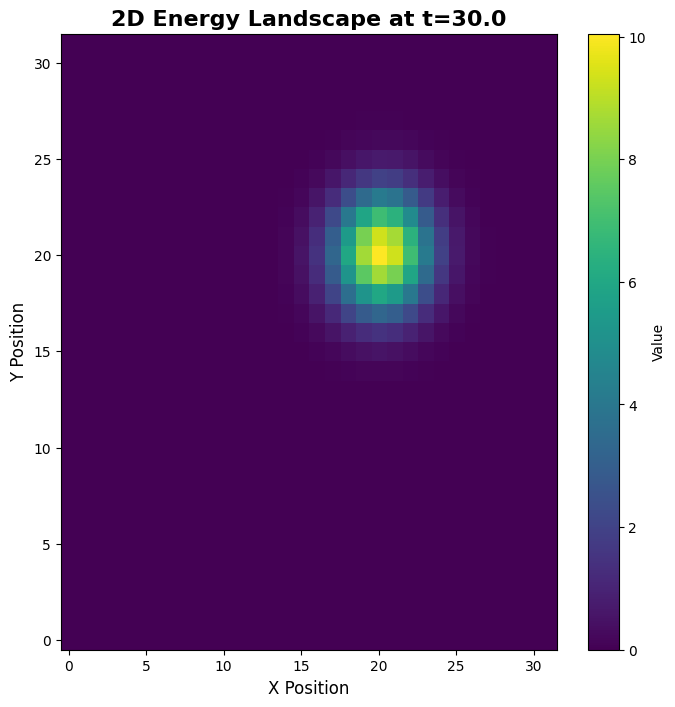

(<Figure size 800x800 with 2 Axes>,
 <Axes: title={'center': '2D Energy Landscape at t=30.0'}, xlabel='X Position', ylabel='Y Position'>)

In [42]:
# Select a time point to visualize
time_idx = 300

# Configure 2D static landscape
config_2d_static = PlotConfigs.energy_landscape_2d_static(
    figsize=(8, 8),
    title=f'2D Energy Landscape at t={time_idx * 0.1:.1f}',
    xlabel='X Position',
    ylabel='Y Position',
    show=True,
    save_path=None
)

# Plot 2D energy landscape at specific time
energy_landscape_2d_static(
    z_data=u_history_2d[time_idx],
    config=config_2d_static
)

The 2D static plot shows the spatial distribution of firing rates at a single time point, revealing the 2D bump structure.

### 4.3 Energy Landscape 2D (Animation)

In [43]:
# Configure 2D animation
config_2d_anim = PlotConfigs.energy_landscape_2d_animation(
    time_steps_per_second=100,
    fps=20,
    figsize=(8, 8),
    title='2D Energy Landscape Animation',
    xlabel='X Position',
    ylabel='Y Position',
    repeat=True,
    show=True,
    save_path=None  # Set to 'animation_2d.gif' to save
)

# Generate 2D energy landscape animation
energy_landscape_2d_animation(
    zs_data=u_history_2d,
    config=config_2d_anim
)

The 2D animation shows the bump moving through the 2D feature space, following the trajectory defined by the task.


---

## 5. Next Steps

Congratulations on completing Tutorial 3! You now know:
- How to use PlotConfigs for unified visualization configuration
- All major 1D and 2D visualization methods in CANNs
- How different tasks produce characteristic energy landscape patterns
- The three key computational capabilities: memory, denoising, and tracking

### Continue Learning

- **Next**: [Tutorial 4: Parameter Effects](./04_parameter_effects.ipynb) - Explore how parameters systematically affect model behavior
- **For Advanced Applications**: Continue with Tutorials 5-7 for hierarchical models and brain-inspired networks
- **For Experimental Data**: See Scenario 2: Data Analysis tutorials

### Key Takeaways

1. **PlotConfigs Pattern**: Always use `PlotConfigs.method_name()` to create configuration, then pass to plotting functions
2. **Default Behavior**: Plots display by default (`show=True, save_path=None`)
3. **Data Sets**: All plotting functions accept `data_sets` dictionary for flexible data input
4. **Task Patterns**: Different tasks reveal different attractor properties (stability, convergence, tracking)